In [1]:
import os
import shutil
import cv2
import math
import random
import numpy as np
import tensorflow as tf
from tensorflow import keras
from collections import deque
import matplotlib.pyplot as plt
plt.style.use("seaborn")

%matplotlib inline

from sklearn.model_selection import train_test_split

from keras.layers import *
from keras.models import Sequential
from tensorflow.keras.utils import to_categorical
from keras.callbacks import EarlyStopping
from tensorflow.keras.utils import plot_model
from tensorflow.keras.applications import InceptionV3

from IPython.display import HTML
from base64 import b64encode

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/tmp/ipykernel_42/1315791772.py:11: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use("seaborn")


In [2]:
def Play_Video(filepath):
    html = ''
    video = open(filepath, 'rb').read()
    src = 'data:video/mp4;base64,' + b64encode(video).decode()
    html += '<video width=640 muted controls autoplay loop><source src="%s" type="video/mp4"></video>' % src
    return HTML(html)

In [3]:
NonViolnceVideos_Dir = "../input/real-life-violence-situations-dataset/Real Life Violence Dataset/NonViolence/"
ViolnceVideos_Dir = "../input/real-life-violence-situations-dataset/Real Life Violence Dataset/Violence/"

In [4]:
NonViolence_files_names_list = os.listdir(NonViolnceVideos_Dir)
Violence_files_names_list = os.listdir(ViolnceVideos_Dir)

In [5]:
Random_NonViolence_Video = random.choice(NonViolence_files_names_list)
Random_Violence_Video = random.choice(Violence_files_names_list)

In [6]:
Play_Video(f"{NonViolnceVideos_Dir}/{Random_NonViolence_Video}")

In [7]:
Play_Video(f"{ViolnceVideos_Dir}/{Random_Violence_Video}")

In [8]:
IMAGE_HEIGHT, IMAGE_WIDTH = 75, 75
SEQUENCE_LENGTH = 16

In [9]:
DATASET_DIR = "../input/real-life-violence-situations-dataset/Real Life Violence Dataset/"

In [10]:
CLASSES_LIST = ["NonViolence", "Violence"]

In [11]:
def frames_extraction(video_path):
    frames_list = []
    video_reader = cv2.VideoCapture(video_path)
    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))
    skip_frames_window = max(int(video_frames_count/SEQUENCE_LENGTH), 1)

    for frame_counter in range(SEQUENCE_LENGTH):
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)
        success, frame = video_reader.read()

        if not success:
            break

        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))
        normalized_frame = resized_frame / 255
        frames_list.append(normalized_frame)

    video_reader.release()
    return frames_list

In [12]:
def create_dataset():
    features = []
    labels = []
    video_files_paths = []

    for class_index, class_name in enumerate(CLASSES_LIST):
        print(f'Extracting Data of Class: {class_name}')
        files_list = os.listdir(os.path.join(DATASET_DIR, class_name))

        for file_name in files_list:
            video_file_path = os.path.join(DATASET_DIR, class_name, file_name)
            frames = frames_extraction(video_file_path)

            if len(frames) == SEQUENCE_LENGTH:
                features.append(frames)
                labels.append(class_index)
                video_files_paths.append(video_file_path)

    features = np.asarray(features)
    labels = np.array(labels)

    return features, labels, video_files_paths

In [13]:
features, labels, video_files_paths = create_dataset()
np.save("features.npy", features)
np.save("labels.npy", labels)
np.save("video_files_paths.npy", video_files_paths)

Extracting Data of Class: NonViolence


[h264 @ 0x58839af5f800] mb_type 104 in P slice too large at 98 31
[h264 @ 0x58839af5f800] error while decoding MB 98 31
[h264 @ 0x58839af5f800] mb_type 104 in P slice too large at 98 31
[h264 @ 0x58839af5f800] error while decoding MB 98 31
[h264 @ 0x58839af5f800] mb_type 104 in P slice too large at 98 31
[h264 @ 0x58839af5f800] error while decoding MB 98 31
[h264 @ 0x58839af5f800] mb_type 104 in P slice too large at 98 31
[h264 @ 0x58839af5f800] error while decoding MB 98 31


Extracting Data of Class: Violence


In [ ]:
features, labels, video_files_paths = np.load("features.npy"), np.load("labels.npy"), np.load("video_files_paths.npy")

In [ ]:
one_hot_encoded_labels = to_categorical(labels)
features_train, features_test, labels_train, labels_test = train_test_split(features, one_hot_encoded_labels, test_size=0.1,
                                                                            shuffle=True, random_state=42)

In [16]:
print(features_train.shape, labels_train.shape)
print(features_test.shape, labels_test.shape)

(1800, 16, 75, 75, 3) (1800, 2)
(200, 16, 75, 75, 3) (200, 2)


In [17]:

inceptionv3 = InceptionV3(include_top=False, weights='imagenet', input_shape=(IMAGE_HEIGHT, IMAGE_WIDTH, 3))
inceptionv3.trainable = True

87910968/87910968 [==============================] - 1s 0us/step


In [18]:
for layer in inceptionv3.layers[:-40]:
    layer.trainable = False

In [19]:
def create_model():
    model = Sequential()
    model.add(Input(shape=(SEQUENCE_LENGTH, IMAGE_HEIGHT, IMAGE_WIDTH, 3)))
    model.add(TimeDistributed(inceptionv3))
    model.add(Dropout(0.25))
    model.add(TimeDistributed(Flatten()))

    lstm_fw = LSTM(units=32)
    lstm_bw = LSTM(units=32, go_backwards=True)
    model.add(Bidirectional(lstm_fw, backward_layer=lstm_bw))

    model.add(Dropout(0.25))
    model.add(Dense(256, activation='relu'))
    model.add(Dropout(0.25))
    model.add(Dense(128, activation='relu'))
    model.add(Dropout(0.25))
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.25))
    model.add(Dense(32, activation='relu'))
    model.add(Dropout(0.25))
    model.add(Dense(len(CLASSES_LIST), activation='softmax'))

    model.summary()
    return model

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed (TimeDist  (None, 16, 1, 1, 2048)    21802784  
 ributed)                                                        
                                                                 
 dropout (Dropout)           (None, 16, 1, 1, 2048)    0         
                                                                 
 time_distributed_1 (TimeDi  (None, 16, 2048)          0         
 stributed)                                                      
                                                                 
 bidirectional (Bidirection  (None, 64)                532736    
 al)                                                             
                                                                 
 dropout_1 (Dropout)         (None, 64)                0         
                                                        

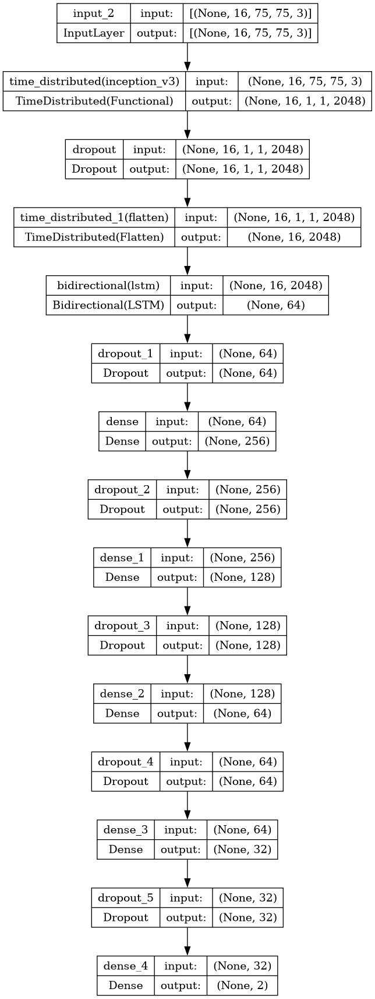

In [20]:
inceptionLSTM_model = create_model()
plot_model(inceptionLSTM_model, to_file='inceptionLSTM_model_structure_plot.png', show_shapes=True, show_layer_names=True)

In [21]:
early_stopping_callback = EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True)
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.6, patience=5, min_lr=0.00005, verbose=1)

In [22]:
inceptionLSTM_model.compile(loss='categorical_crossentropy', optimizer='sgd', metrics=["accuracy"])
inceptionLSTM_model_history = inceptionLSTM_model.fit(x=features_train, y=labels_train, epochs=50, batch_size=8,
                                             shuffle=True, validation_split=0.2,
                                             callbacks=[early_stopping_callback, reduce_lr])


Epoch 1/50
180/180 [==============================] - 30s 86ms/step - loss: 0.6798 - accuracy: 0.5486 - val_loss: 0.6431 - val_accuracy: 0.7194 - lr: 0.0100
Epoch 2/50
180/180 [==============================] - 12s 68ms/step - loss: 0.6279 - accuracy: 0.6590 - val_loss: 0.5466 - val_accuracy: 0.7972 - lr: 0.0100
Epoch 3/50
180/180 [==============================] - 12s 69ms/step - loss: 0.5329 - accuracy: 0.7549 - val_loss: 0.4080 - val_accuracy: 0.8500 - lr: 0.0100
Epoch 4/50
180/180 [==============================] - 12s 69ms/step - loss: 0.4456 - accuracy: 0.8021 - val_loss: 0.3771 - val_accuracy: 0.8472 - lr: 0.0100
Epoch 5/50
180/180 [==============================] - 13s 72ms/step - loss: 0.3671 - accuracy: 0.8597 - val_loss: 0.3320 - val_accuracy: 0.8583 - lr: 0.0100
Epoch 6/50
180/180 [==============================] - 13s 73ms/step - loss: 0.2876 - accuracy: 0.8868 - val_loss: 0.3200 - val_accuracy: 0.8667 - lr: 0.0100
Epoch 7/50
180/180 [==============================] - 13s 

In [23]:
model_evaluation_history = inceptionLSTM_model.evaluate(features_test, labels_test)

7/7 [==============================] - 7s 89ms/step - loss: 0.3120 - accuracy: 0.8800


In [24]:
inceptionLSTM_model.save('inceptionLSTM_model.h5')

/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [25]:
def plot_metric(model_training_history, metric_name_1, metric_name_2, plot_name):
    metric_value_1 = model_training_history.history[metric_name_1]
    metric_value_2 = model_training_history.history[metric_name_2]
    epochs = range(len(metric_value_1))

    plt.plot(epochs, metric_value_1, 'blue', label=metric_name_1)
    plt.plot(epochs, metric_value_2, 'orange', label=metric_name_2)
    plt.title(str(plot_name))
    plt.legend()

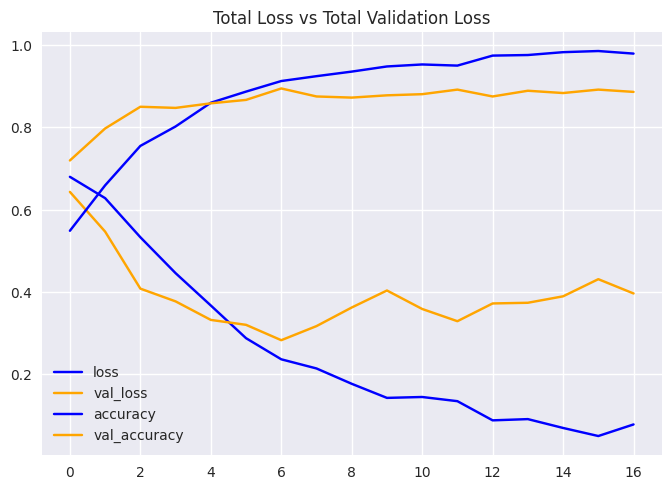

In [26]:
plot_metric(inceptionLSTM_model_history, 'loss', 'val_loss', 'Total Loss vs Total Validation Loss')
plot_metric(inceptionLSTM_model_history, 'accuracy', 'val_accuracy', 'Total Loss vs Total Validation Loss')

In [27]:
labels_predict = inceptionLSTM_model.predict(features_test)
labels_predict = np.argmax(labels_predict, axis=1)
labels_test_normal = np.argmax(labels_test, axis=1)

7/7 [==============================] - 4s 85ms/step


In [28]:
from sklearn.metrics import accuracy_score

AccScore = accuracy_score(labels_predict, labels_test_normal)
print('Accuracy Score is : ', AccScore)

Accuracy Score is :  0.88


[Text(0, 0.5, 'NonViolence'), Text(0, 1.5, 'Violence')]

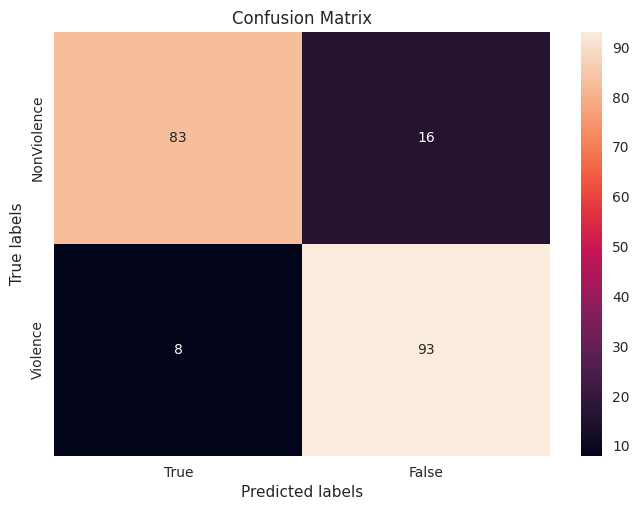

In [29]:
import seaborn as sns
from sklearn.metrics import confusion_matrix

ax = plt.subplot()
cm = confusion_matrix(labels_test_normal, labels_predict)
sns.heatmap(cm, annot=True, fmt='g', ax=ax)
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')
ax.xaxis.set_ticklabels(['True', 'False'])
ax.yaxis.set_ticklabels(['NonViolence', 'Violence'])

In [30]:
from sklearn.metrics import classification_report

ClassificationReport = classification_report(labels_test_normal, labels_predict)
print('Classification Report is : \n', ClassificationReport)

Classification Report is : 
               precision    recall  f1-score   support

           0       0.91      0.84      0.87        99
           1       0.85      0.92      0.89       101

    accuracy                           0.88       200
   macro avg       0.88      0.88      0.88       200
weighted avg       0.88      0.88      0.88       200



In [31]:
def predict_frames(video_file_path, output_file_path, SEQUENCE_LENGTH):
    video_reader = cv2.VideoCapture(video_file_path)
    original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))
    video_writer = cv2.VideoWriter(output_file_path, cv2.VideoWriter_fourcc('m', 'p', '4', 'v'),
                                   video_reader.get(cv2.CAP_PROP_FPS), (original_video_width, original_video_height))
    frames_queue = deque(maxlen=SEQUENCE_LENGTH)
    predicted_class_name = ''

    while video_reader.isOpened():
        ok, frame = video_reader.read()

        if not ok:
            break

        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))
        normalized_frame = resized_frame / 255
        frames_queue.append(normalized_frame)

        if len(frames_queue) == SEQUENCE_LENGTH:
            predicted_labels_probabilities = inceptionLSTM_model.predict(np.expand_dims(frames_queue, axis=0))[0]
            predicted_label = np.argmax(predicted_labels_probabilities)
            predicted_class_name = CLASSES_LIST[predicted_label]

        if predicted_class_name == "Violence":
            cv2.putText(frame, predicted_class_name, (5, 100), cv2.FONT_HERSHEY_SIMPLEX, 3, (0, 0, 255), 12)
        else:
            cv2.putText(frame, predicted_class_name, (5, 100), cv2.FONT_HERSHEY_SIMPLEX, 3, (0, 255, 0), 12)

        video_writer.write(frame)

    video_reader.release()
    video_writer.release()

plt.style.use("default")

In [32]:
def show_pred_frames(pred_video_path):
    plt.figure(figsize=(20, 15))
    video_reader = cv2.VideoCapture(pred_video_path)
    frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))
    random_range = sorted(random.sample(range(SEQUENCE_LENGTH, frames_count), 12))

    for counter, random_index in enumerate(random_range, 1):
        plt.subplot(5, 4, counter)
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, random_index)
        ok, frame = video_reader.read()

        if not ok:
            break

        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        plt.imshow(frame)
        ax.figure.set_size_inches(20, 20)
        plt.tight_layout()

    video_reader.release()

In [33]:
test_videos_directory = 'test_videos'
os.makedirs(test_videos_directory, exist_ok=True)
output_video_file_path = f'{test_videos_directory}/Output-Test-Video.mp4'

1/1 [==============================] - 0s 26ms/step


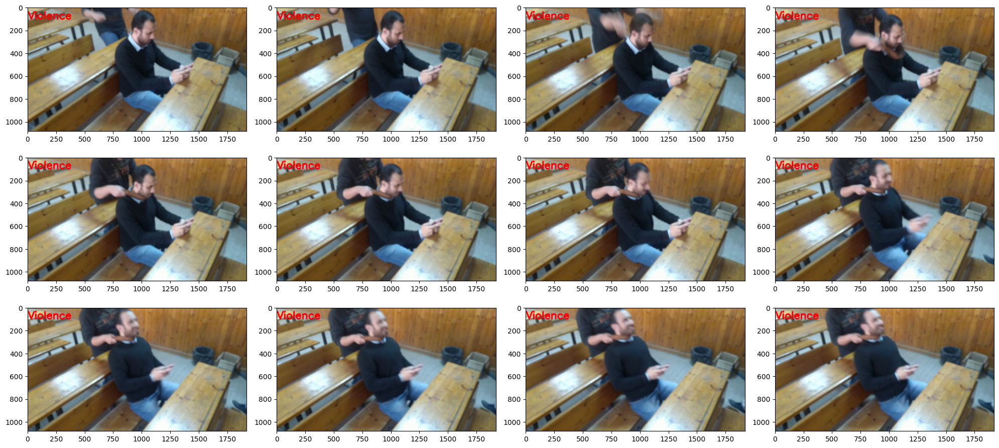

In [34]:
input_video_file_path = "/kaggle/input/real-life-violence-situations-dataset/Real Life Violence Dataset/Violence/V_10.mp4"
predict_frames(input_video_file_path, output_video_file_path, SEQUENCE_LENGTH)
show_pred_frames(output_video_file_path)
Play_Video(input_video_file_path)

1/1 [==============================] - 0s 28ms/step


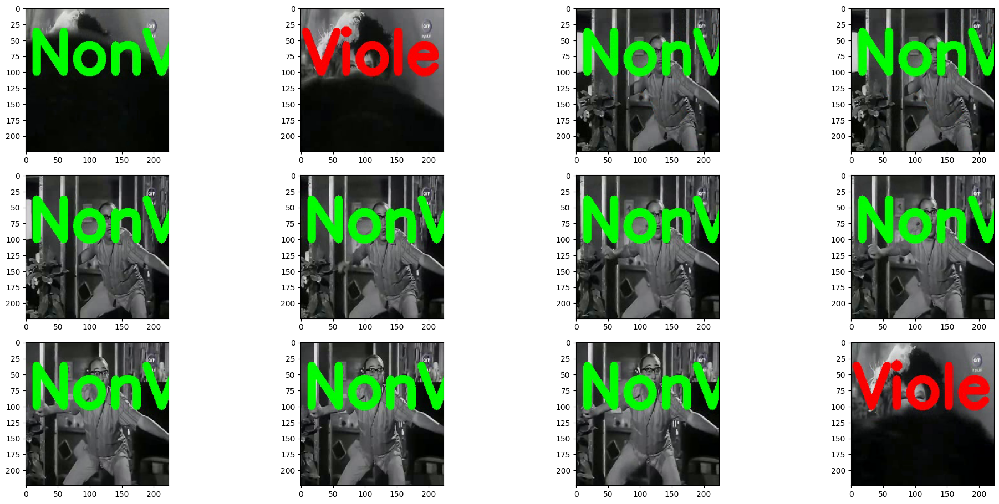

In [47]:
input_video_file_path = "/kaggle/input/real-life-violence-situations-dataset/Real Life Violence Dataset/NonViolence/NV_105.mp4"
predict_frames(input_video_file_path, output_video_file_path, SEQUENCE_LENGTH)
show_pred_frames(output_video_file_path)
Play_Video(input_video_file_path)

1/1 [==============================] - 0s 27ms/step


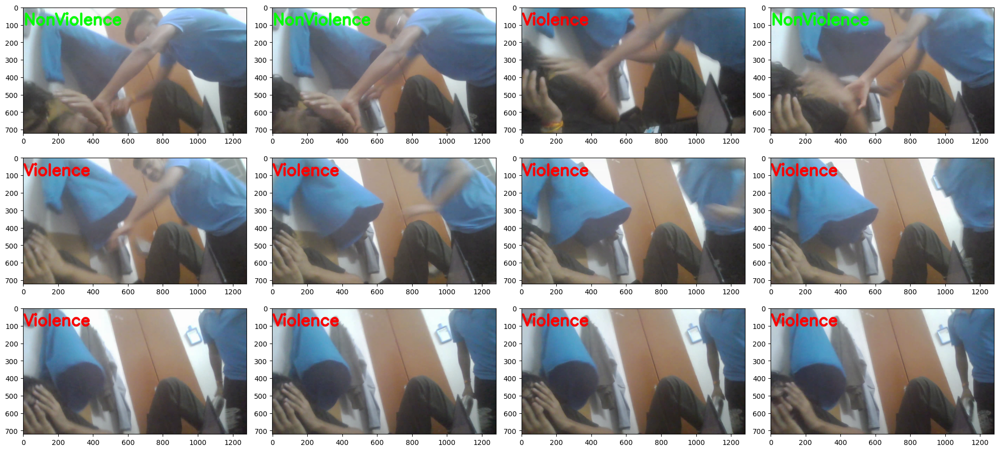

In [46]:
input_video_file_path = "/kaggle/input/svvsbas/WIN_20240520_03_12_44_Pro.mp4"
predict_frames(input_video_file_path, output_video_file_path, SEQUENCE_LENGTH)
show_pred_frames(output_video_file_path)
Play_Video(input_video_file_path)

In [36]:
def predict_video(video_file_path, SEQUENCE_LENGTH):
    video_reader = cv2.VideoCapture(video_file_path)
    original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))
    frames_list = []
    predicted_class_name = ''
    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))
    skip_frames_window = max(int(video_frames_count/SEQUENCE_LENGTH), 1)

    for frame_counter in range(SEQUENCE_LENGTH):
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)
        success, frame = video_reader.read()

        if not success:
            break

        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))
        normalized_frame = resized_frame / 255
        frames_list.append(normalized_frame)

    predicted_labels_probabilities = inceptionLSTM_model.predict(np.expand_dims(frames_list, axis=0))[0]
    predicted_label = np.argmax(predicted_labels_probabilities)
    predicted_class_name = CLASSES_LIST[predicted_label]

    print(f'Predicted: {predicted_class_name}\nConfidence: {predicted_labels_probabilities[predicted_label]}')

    video_reader.release()

In [42]:


from pytube import YouTube

def predict_video_from_url(video_url, sequence_length=16):
    try:
        # Get YouTube video details using pytube
        youtube_video = YouTube(video_url)
        video_stream = youtube_video.streams.filter(file_extension="mp4").first()
        video_stream_url = video_stream.url

        # Perform prediction on the video
        predict_video(video_stream_url, sequence_length)

    except Exception as e:
        print(f"Error: {e}")

In [38]:
!pip install pytube

  Obtaining dependency information for pytube from https://files.pythonhosted.org/packages/51/64/bcf8632ed2b7a36bbf84a0544885ffa1d0b4bcf25cc0903dba66ec5fdad9/pytube-15.0.0-py3-none-any.whl.metadata
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.6/57.6 kB 2.5 MB/s eta 0:00:00


In [44]:
# Test the user video URL prediction function
user_video_url = "https://www.youtube.com/watch?v=46W7uzj-51w"
predict_video_from_url(user_video_url)

Error: HTTP Error 403: Forbidden
